## QUESTION2


In [38]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import imageio
cv2.ocl.setUseOpenCL(False)
import warnings
warnings.filterwarnings('ignore')
import imutils

### PARTA (Extract Key Points)

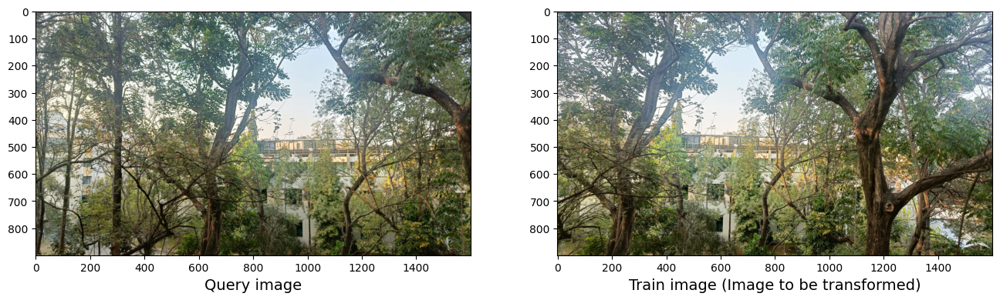

In [18]:
train_photo = cv2.imread('pano2.jpg')

# OpenCV defines the color channel in the order BGR 
# Hence converting to RGB for Matplotlib
train_photo = cv2.cvtColor(train_photo,cv2.COLOR_BGR2RGB)

# converting to grayscale
train_photo_gray = cv2.cvtColor(train_photo, cv2.COLOR_RGB2GRAY)

# Do the same for the query image 
query_photo = cv2.imread('pano1.jpg')
query_photo = cv2.cvtColor(query_photo,cv2.COLOR_BGR2RGB)
query_photo_gray = cv2.cvtColor(query_photo, cv2.COLOR_RGB2GRAY)

# Now view/plot the images
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, constrained_layout=False, figsize=(16,9))
ax1.imshow(query_photo, cmap="gray")
ax1.set_xlabel("Query image", fontsize=14)

ax2.imshow(train_photo, cmap="gray")
ax2.set_xlabel("Train image (Image to be transformed)", fontsize=14)



plt.show()

In [20]:
feature_extraction_algo = 'sift'
def select_descriptor_methods(image, method=None):    
    
    assert method is not None, "Please define a feature descriptor method. accepted Values are: 'sift', 'surf'"
    
    if method == 'sift':
        descriptor = cv2.SIFT_create()
    elif method == 'surf':
        descriptor = cv2.SURF_create()
    elif method == 'brisk':
        descriptor = cv2.BRISK_create()
    elif method == 'orb':
        descriptor = cv2.ORB_create()
        
    (keypoints, features) = descriptor.detectAndCompute(image, None)
    
    return (keypoints, features)
keypoints_train_img, features_train_img = select_descriptor_methods(train_photo_gray, method=feature_extraction_algo)

keypoints_query_img, features_query_img = select_descriptor_methods(query_photo_gray, method=feature_extraction_algo)

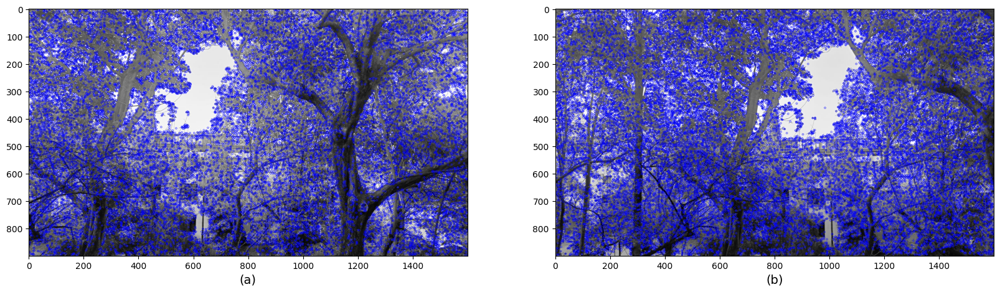

In [26]:
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,8), constrained_layout=False)

ax1.imshow(cv2.drawKeypoints(train_photo_gray, keypoints_train_img, None, color=(0,0,255)))

ax1.set_xlabel("(a)", fontsize=14)

ax2.imshow(cv2.drawKeypoints(query_photo_gray,keypoints_query_img,None,color=(0,0,255)))
ax2.set_xlabel("(b)", fontsize=14)


plt.show()

### PART B (Image Stitching)

##### 1) USING KEYPOINTS

In [48]:
def create_matching_object(method,crossCheck):
    "Create and return a Matcher Object"
    
    # For BF matcher, first we have to create the BFMatcher object using cv2.BFMatcher(). 
    # It takes two optional params. 
    # normType - It specifies the distance measurement
    # crossCheck - which is false by default. If it is true, Matcher returns only those matches 
    # with value (i,j) such that i-th descriptor in set A has j-th descriptor in set B as the best match 
    # and vice-versa. 
    if method == 'sift' or method == 'surf':
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=crossCheck)
    elif method == 'orb' or method == 'brisk':
        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=crossCheck)
    return bf

In [50]:
def key_points_matching(features_train_img, features_query_img, method):
    """
    Perform key points matching between the features of a train image and a query image using a specified method.

    Parameters:
    features_train_img (np.ndarray): Features of the train image.
    features_query_img (np.ndarray): Features of the query image.
    method (str): Method to use for matching.

    Returns:
    rawMatches (list): List of raw matches between the train and query images.
    """
    bf = create_matching_object(method, crossCheck=True)
        
    # Match descriptors.
    best_matches = bf.match(features_train_img,features_query_img)
    
    # Sort the features in order of distance.
    # The points with small distance (more similarity) are ordered first in the vector
    rawMatches = sorted(best_matches, key = lambda x:x.distance)
    print("Raw matches with Brute force):", len(rawMatches))
    return rawMatches


In [52]:
def key_points_matching_KNN(features_train_img, features_query_img, ratio, method):
    """
    Perform key points matching using K-Nearest Neighbors (KNN) algorithm.

    Args:
        features_train_img (list): List of features from the training image.
        features_query_img (list): List of features from the query image.
        ratio (float): Ratio threshold for Lowe's ratio test.
        method (string): Method for creating the matching object.

    Returns:
        list: List of matches between key points in the training and query images.
    """
    bf = create_matching_object(method, crossCheck=False)
    # compute the raw matches and initialize the list of actual matches
    rawMatches = bf.knnMatch(features_train_img, features_query_img, k=2)
    print("Raw matches (knn):", len(rawMatches))
    matches = []

    # loop over the raw matches
    for m,n in rawMatches:
        # ensure the distance is within a certain ratio of each
        # other (i.e. Lowe's ratio test)
        if m.distance < n.distance * ratio:
            matches.append(m)
    return matches

Drawing: bf matched features Lines
Raw matches with Brute force): 9160


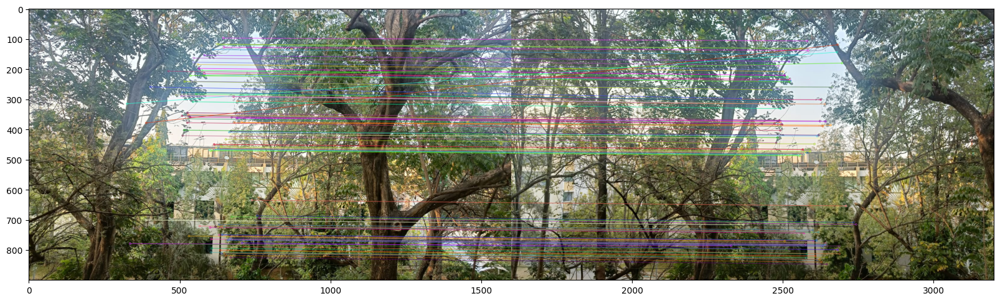

In [54]:
feature_to_match = 'bf'
print("Drawing: {} matched features Lines".format(feature_to_match))

fig = plt.figure(figsize=(20,8))

if feature_to_match == 'bf':
    matches = key_points_matching(features_train_img, features_query_img, method=feature_extraction_algo)
    
    mapped_features_image = cv2.drawMatches(train_photo,keypoints_train_img,query_photo,keypoints_query_img,matches[:100],
                           None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Now for cross checking draw the feature-mapping lines also with KNN
elif feature_to_match == 'knn':
    matches = key_points_matching_KNN(features_train_img, features_query_img, ratio=0.75, method=feature_extraction_algo)
    
    mapped_features_image_knn = cv2.drawMatches(train_photo, keypoints_train_img, query_photo, keypoints_query_img, np.random.choice(matches,100),
                           None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    

plt.imshow(mapped_features_image)


Drawing: knn matched features Lines
Raw matches (knn): 23085


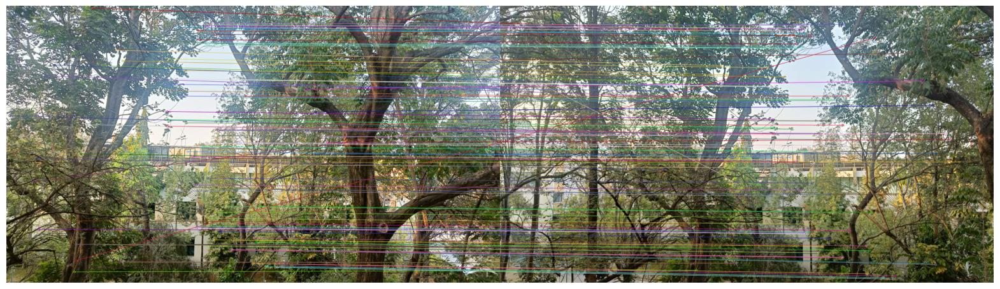

In [55]:
feature_to_match = 'knn'

print("Drawing: {} matched features Lines".format(feature_to_match))

fig = plt.figure(figsize=(20,8))

if feature_to_match == 'bf':
    matches = key_points_matching(features_train_img, features_query_img, method=feature_extraction_algo)
    
    mapped_features_image = cv2.drawMatches(train_photo,keypoints_train_img,query_photo,keypoints_query_img,matches[:100],
                           None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Now for cross checking draw the feature-mapping lines also with KNN
elif feature_to_match == 'knn':
    matches = key_points_matching_KNN(features_train_img, features_query_img, ratio=0.75, method=feature_extraction_algo)
    
    mapped_features_image_knn = cv2.drawMatches(train_photo, keypoints_train_img, query_photo, keypoints_query_img, np.random.choice(matches,100),
                           None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    

plt.imshow(mapped_features_image_knn)
plt.axis('off')

plt.show()

In [58]:
def homography_stitching(keypoints_train_img, keypoints_query_img, matches, reprojThresh):   
    """ 
    
    Perform homography stitching by calculating the homography matrix.
    converting the keypoints to numpy arrays before passing them for calculating Homography Matrix.
    
    Because we are supposed to pass 2 arrays of coordinates to cv2.findHomography, as in I have these points in image-1, and I have points in image-2, so now what is the homography matrix to transform the points from image 1 to image 2

    Args:
        keypoints_train_img (list): List of keypoints from the training image.
        keypoints_query_img (list): List of keypoints from the query image.
        matches (list): List of matches between key points in the training and query images.
        reprojThresh (float): Reprojection threshold for the RANSAC algorithm.

    Returns:
        tuple: Tuple containing the matches, homography matrix, and status.
               - matches (list): List of matches between key points in the training and query images.
               - H (numpy.ndarray): Homography matrix.
               - status (numpy.ndarray): Status of inlier points.

    Note:
        The minimum number of matches required for calculating the homography is 4.
    
    
    """
    keypoints_train_img = np.float32([keypoint.pt for keypoint in keypoints_train_img])
    keypoints_query_img = np.float32([keypoint.pt for keypoint in keypoints_query_img])
    
    ''' For findHomography() - I need to have an assumption of a minimum of correspondence points that are present between the 2 images. Here, I am assuming that Minimum Match Count to be 4 '''
    if len(matches) > 4:
        # construct the two sets of points
        points_train = np.float32([keypoints_train_img[m.queryIdx] for m in matches])
        points_query = np.float32([keypoints_query_img[m.trainIdx] for m in matches])
        
        # Calculate the homography between the sets of points
        (H, status) = cv2.findHomography(points_train, points_query, cv2.RANSAC, reprojThresh)

        return (matches, H, status)
    else:
        return None

In [60]:
M = homography_stitching(keypoints_train_img, keypoints_query_img, matches, reprojThresh=4)

if M is None:
    print("Error!")

(matches, Homography_Matrix, status) = M

print(Homography_Matrix)

[[ 5.82900750e-01  3.23978100e-02  4.33868600e+02]
 [-1.64669865e-01  8.28759249e-01  1.16199037e+02]
 [-2.61629253e-04 -1.42613971e-05  1.00000000e+00]]


width  3200


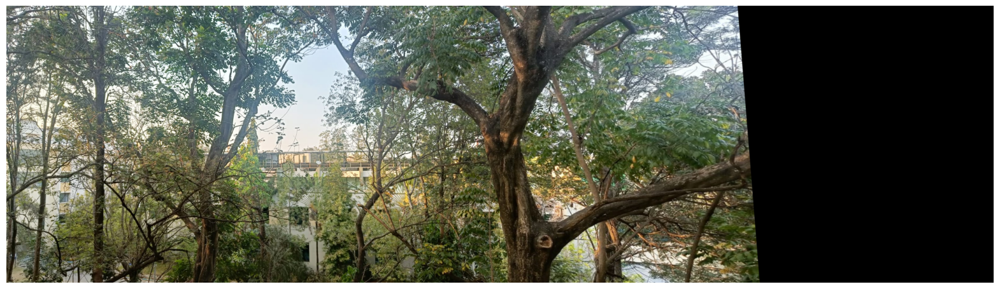

In [64]:
# For the calculation of the width and height of the final horizontal panoramic images 
# I can just add the widths of the individual images and for the height
# I can take the max from the 2 individual images.

width = query_photo.shape[1] + train_photo.shape[1]
print("width ", width) 
# 2922 - Which is exactly the sum value of the width of 
# my train.jpg and query.jpg


height = max(query_photo.shape[0], train_photo.shape[0])

# otherwise, apply a perspective warp to stitch the images together

# Now just plug that "Homography_Matrix"  into cv::warpedPerspective and I shall have a warped image1 into image2 frame

result = cv2.warpPerspective(train_photo, Homography_Matrix,  (width, height))

# The warpPerspective() function returns an image or video whose size is the same as the size of the original image or video. Hence set the pixels as per my query_photo

result[0:query_photo.shape[0], 0:query_photo.shape[1]] = query_photo

plt.figure(figsize=(20,10))
plt.axis('off')
plt.imshow(result)



plt.show()

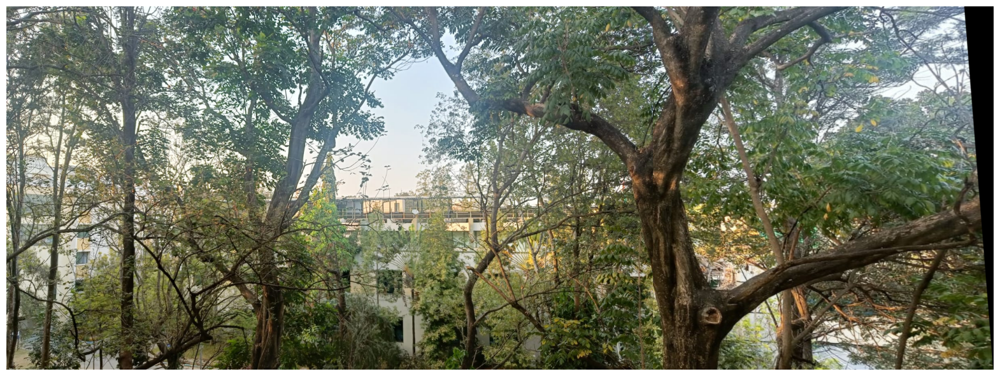

In [70]:
# Warp the image
result = cv2.warpPerspective(train_photo, Homography_Matrix, (width, height))

# Overlay the query image
result[0:query_photo.shape[0], 0:query_photo.shape[1]] = query_photo

# Convert to grayscale
gray = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)

# Find all non-black pixels
coords = cv2.findNonZero(gray)

# Get bounding box of non-black area
x, y, w, h = cv2.boundingRect(coords)

# Crop the result
cropped_result = result[y:y+h, x:x+w]

# Display the cropped image
plt.figure(figsize=(20,10))
plt.axis('off')
plt.imshow(cropped_result)
plt.show()


##### 2) DIRECTLY USING CV2 Stitcher_create()

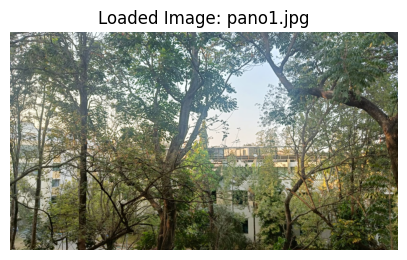

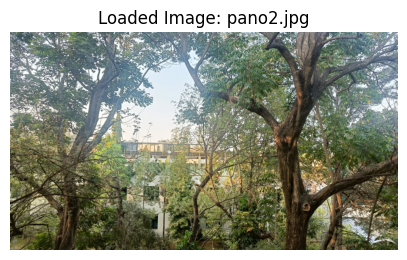

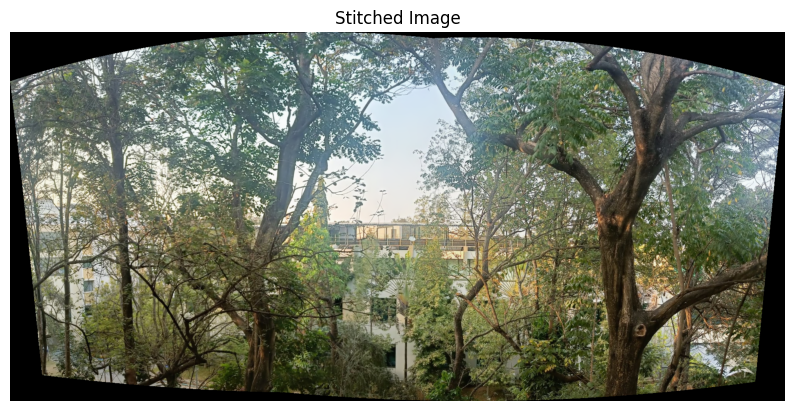

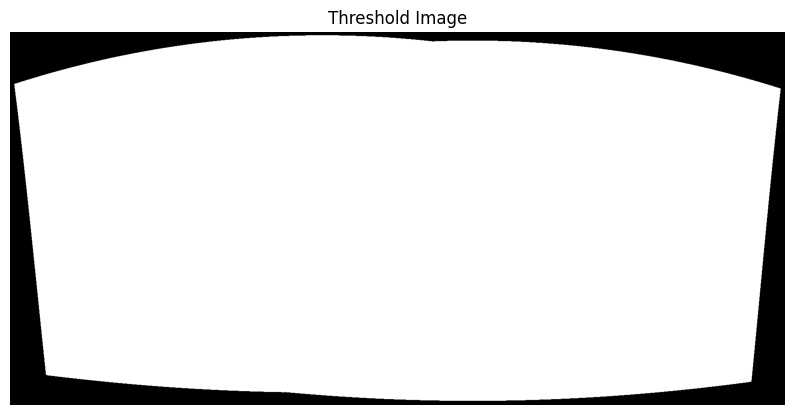

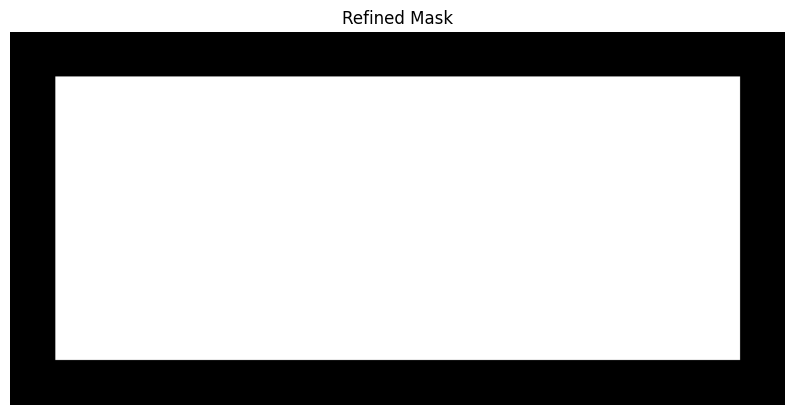

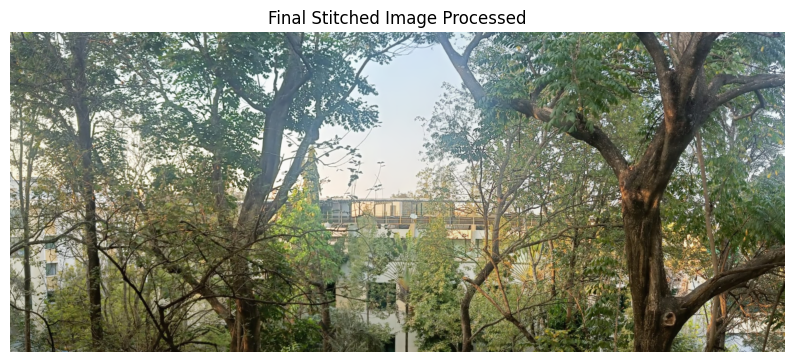

In [40]:
# List of images to stitch
image_paths = ["pano1.jpg", "pano2.jpg"]
images = []

# Load images
for image_path in image_paths:
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error loading {image_path}")
        continue
    images.append(img)
    
    # Convert BGR to RGB for Matplotlib display
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Show loaded images
    plt.figure(figsize=(5, 5))
    plt.imshow(img_rgb)
    plt.title(f"Loaded Image: {image_path}")
    plt.axis("off")
    plt.show()

# Create stitcher and perform stitching
image_stitcher = cv2.Stitcher_create()
error, stitched_img = image_stitcher.stitch(images)

if error == cv2.STITCHER_OK:
    cv2.imwrite("stitchedOutput.png", stitched_img)

    # Convert BGR to RGB for display
    stitched_rgb = cv2.cvtColor(stitched_img, cv2.COLOR_BGR2RGB)

    # Show stitched image
    plt.figure(figsize=(10, 5))
    plt.imshow(stitched_rgb)
    plt.title("Stitched Image")
    plt.axis("off")
    plt.show()

    # Add border to avoid cutting edges
    stitched_img = cv2.copyMakeBorder(stitched_img, 10, 10, 10, 10, cv2.BORDER_CONSTANT, (0, 0, 0))

    # Convert to grayscale and threshold
    gray = cv2.cvtColor(stitched_img, cv2.COLOR_BGR2GRAY)
    thresh_img = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]

    # Show thresholded image
    plt.figure(figsize=(10, 5))
    plt.imshow(thresh_img, cmap="gray")
    plt.title("Threshold Image")
    plt.axis("off")
    plt.show()

    # Find external contours
    contours = cv2.findContours(thresh_img.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = imutils.grab_contours(contours)
    areaOI = max(contours, key=cv2.contourArea)

    # Create a mask and get bounding rectangle
    mask = np.zeros(thresh_img.shape, dtype="uint8")
    x, y, w, h = cv2.boundingRect(areaOI)
    cv2.rectangle(mask, (x, y), (x + w, y + h), 255, -1)

    # Refine cropping using erosion
    minRectangle = mask.copy()
    sub = mask.copy()
    while cv2.countNonZero(sub) > 0:
        minRectangle = cv2.erode(minRectangle, None)
        sub = cv2.subtract(minRectangle, thresh_img)

    # Find contours again after erosion
    contours = cv2.findContours(minRectangle.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = imutils.grab_contours(contours)
    areaOI = max(contours, key=cv2.contourArea)

    # Show refined mask
    plt.figure(figsize=(10, 5))
    plt.imshow(minRectangle, cmap="gray")
    plt.title("Refined Mask")
    plt.axis("off")
    plt.show()

    # Get final crop coordinates and crop the stitched image
    x, y, w, h = cv2.boundingRect(areaOI)
    stitched_img = stitched_img[y:y + h, x:x + w]

    # Save the final processed image
    cv2.imwrite("stitchedOutputProcessed.png", stitched_img)

    # Convert BGR to RGB for final display
    final_rgb = cv2.cvtColor(stitched_img, cv2.COLOR_BGR2RGB)

    # Show final processed stitched image
    plt.figure(figsize=(10, 5))
    plt.imshow(final_rgb)
    plt.title("Final Stitched Image Processed")
    plt.axis("off")
    plt.show()

else:
    print("Images could not be stitched!")
    print("Likely not enough keypoints being detected.")
